In [1]:
import os
import cv2
import sqlite3
import numpy as np
import pandas as pd
import seaborn as sns
from matplotlib import pyplot as plt
from plotly import graph_objects as go
from numpy import linalg as LA

from visualize_model import Model
from database import blob_to_array, pair_id_to_image_ids

Jupyter environment detected. Enabling Open3D WebVisualizer.
[Open3D INFO] WebRTC GUI backend enabled.
[Open3D INFO] WebRTCWindowSystem: HTTP handshake server disabled.


# 2. Analyze reconstructions using python
## 2.1. Run the notebook, using the Gerrard Hall reconstruction (0.5)
#### <span style='color:Green'> - Add the path to your reconstruction. Answer the questions at the end  </span>

In [2]:
# Add your path
reconstruction_path = "./gerrard-hall/sparse"
database_path = "./gerrard-hall/database.db"

#### Load an existing reconstruction and print its contents

In [3]:
model = Model()
model.read_model(reconstruction_path, ext='.txt') # Should also work with .txt

In [4]:
images = model.images
sorted_images = sorted(images.values())
cameras = model.cameras
points3D = model.points3D

In [5]:
print(f"Loaded {len(images)} images. This is the information available for one of them:")
print(images[1])
print(f"\nLoaded {len(cameras)} cameras. This is the information available for one of them:")
print(cameras[1])
print(f"\nLoaded {len(points3D)} 3D points. This is the information available for one of them:")
print(points3D[1])

Loaded 100 images. This is the information available for one of them:
Image(id=1, qvec=array([ 0.640157,  0.206439, -0.252259,  0.695664]), tvec=array([-0.720058, -1.96521 ,  2.73524 ]), camera_id=1, name='IMG_2387.JPG', xys=array([[ 758.386 ,   61.3678],
       [2757.87  ,   11.2852],
       [2775.63  ,   33.5677],
       ...,
       [1864.09  , 3612.57  ],
       [2398.21  , 3603.64  ],
       [2398.21  , 3603.64  ]]), point3D_ids=array([-1, -1, -1, ..., -1, -1, -1]))

Loaded 1 cameras. This is the information available for one of them:
Camera(id=1, model='OPENCV', width=5616, height=3744, params=array([ 3.83827e+03,  3.83722e+03,  2.80800e+03,  1.87200e+03,
       -1.10339e-01,  7.95470e-02,  1.16211e-04,  2.94830e-04]))

Loaded 43188 3D points. This is the information available for one of them:
Point3D(id=1, xyz=array([ 1.05663, -1.42799, -1.68133]), rgb=array([199, 197, 190]), error=0.448922, image_ids=array([99, 63, 27, 18, 42, 50, 26, 35, 28,  1, 67]), point2D_idxs=array([  84, 

#### Load the database

In [2]:
def load_keypoints_and_matches(database_path):
    """Load keypoints and matches from the database.
    Args:
        database_path: Database path.
    Returns:
        keypoints: List of keypoints for each image.
        matches: List of matches for each pair of images.
    """
    db = sqlite3.connect(database_path)
    keypoints = dict(
        (image_id, blob_to_array(data, np.float32, (-1, cols)))
        for image_id, cols, data in db.execute(
            "SELECT image_id, cols, data FROM keypoints"))
            
    matches = dict()
    count_no_data = 0

    for pair_id, data in db.execute("SELECT pair_id, data FROM matches"):
        if data is None:
            count_no_data += 1
        else:
            matches[pair_id_to_image_ids(pair_id)] = blob_to_array(data, np.uint32, (-1, 2))
            
    db.close()
    return keypoints, matches, count_no_data

In [7]:
keypoints, matches, count_no_data = load_keypoints_and_matches(database_path)

In [8]:
print(f"Loaded keypoints from {len(keypoints)} images. These are the {len(keypoints[1])} keypoints for one of them:")
print(keypoints[1])

Loaded keypoints from 100 images. These are the 12207 keypoints for one of them:
[[7.5838574e+02 6.1367775e+01 4.0777049e+00 2.3697526e+00]
 [2.7578696e+03 1.1285216e+01 4.1808290e+00 6.2510014e+00]
 [2.7756296e+03 3.3567684e+01 4.9552236e+00 1.4129657e+00]
 ...
 [1.8640872e+03 3.6125742e+03 4.9121723e+01 5.6264076e+00]
 [2.3982122e+03 3.6036423e+03 4.2930962e+01 4.8993421e+00]
 [2.3982122e+03 3.6036423e+03 4.2930962e+01 2.5109098e+00]]


In [9]:
print(f"Loaded {len(matches)} matches. {count_no_data}/{len(matches)+count_no_data} matches contained no data")

Loaded 2153 matches. 2797/4950 matches contained no data


In [10]:
print("These are the matches between two images:")
print(matches[1.0,3])

These are the matches between two images:
[[1459   68]
 [8054  481]
 [8113  482]
 [8114  483]
 [8187  484]
 [6590  512]
 [8009  603]
 [8053  608]
 [8184  611]
 [8111  612]
 [8112  613]
 [8052  774]
 [8182  775]
 [8181  777]
 [5326  783]
 [5806  797]
 [8005  903]
 [8107  907]
 [8110  909]
 [8048  910]
 [8049  911]
 [8180  914]
 [8177  915]
 [8175  916]
 [5067  917]
 [8178  919]
 [5800  926]
 [6416  939]
 [8002 1041]
 [8000 1043]
 [8001 1044]
 [8044 1050]
 [5684 1062]
 [7995 1191]
 [8104 1192]
 [8099 1194]
 [8097 1196]
 [8100 1197]
 [8096 1198]
 [8169 1200]
 [8171 1201]
 [6658 1223]
 [8039 1339]
 [8092 1340]
 [8088 1341]
 [8094 1342]
 [8168 1343]
 [6477 1384]
 [7172 1397]
 [7173 1398]
 [7170 1399]
 [7168 1400]
 [7994 1491]
 [7991 1492]
 [7992 1493]
 [8036 1496]
 [7993 1498]
 [8087 1505]
 [5912 1525]
 [7003 1549]
 [7002 1550]
 [7986 1684]
 [8032 1685]
 [8165 1687]
 [8163 1688]
 [6570 1709]
 [6565 1710]
 [7237 1735]
 [8033 1855]
 [8031 1856]
 [8086 1857]
 [8085 1858]
 [8162 1860]
 [5436 18

#### Visualize the point cloud and cameras

In [12]:
model.create_window()
model.add_points()
model.add_cameras(scale=0.25)
model.show()

#### <span style='color:Green'>  How many keypoints there are in total? </span> 

In [13]:
count_keypoints = [len(img.xys) for img in sorted(images.values())]
print(f"Total number of keypoints: {np.sum(count_keypoints)}")
print(f"Average number of keypoints per image: {np.mean(count_keypoints)}")

Total number of keypoints: 1061700
Average number of keypoints per image: 10617.0


#### <span style='color:Green'>  How many 3D points originated from a keypoint in the first image? </span>


In [14]:
count_3Dpoints = [np.sum(img.point3D_ids != -1) for img in sorted(images.values())]
print(f"Total number of 3D points: {np.sum(count_3Dpoints)}")
print(f"Keypoints in Image 1: {count_keypoints[0]}")
print(f"3D points in Image 1: {count_3Dpoints[0]}")

Total number of 3D points: 250286
Keypoints in Image 1: 12207
3D points in Image 1: 2819


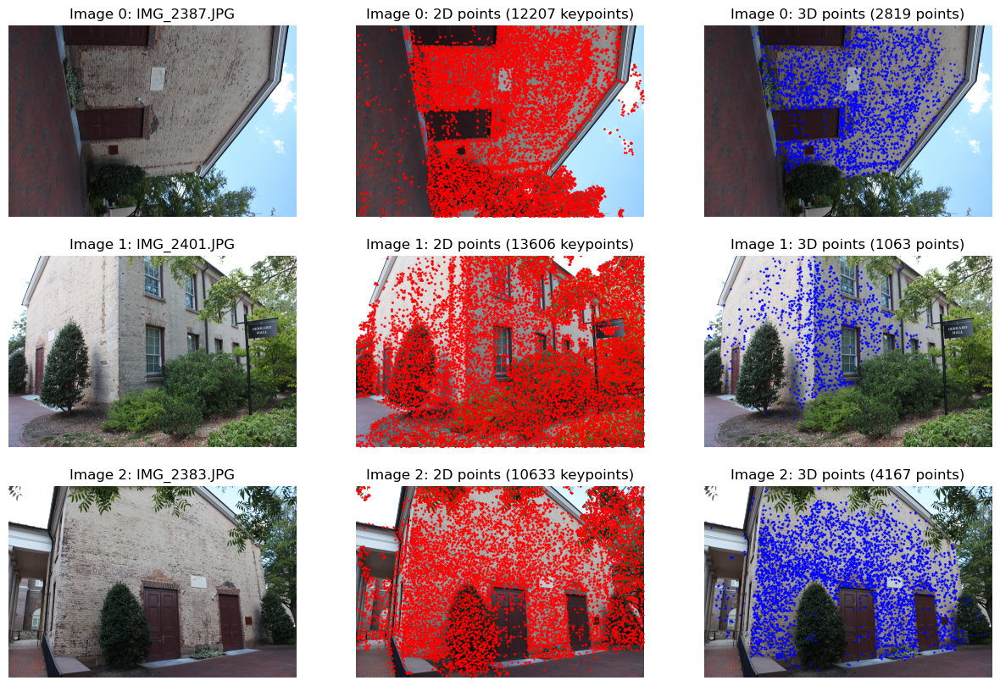

In [15]:
# Subplot N rows of 3 images:
N = 3
fig, axs = plt.subplots(N, 3, figsize=(15, 10))

for i in range(N):
    # Load image
    image = cv2.imread('./gerrard-hall/images/' + sorted_images[i].name)
    # Convert to RGB
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    # Plot image
    axs[i, 0].imshow(image)
    axs[i, 0].axis('off')
    axs[i, 0].set_title(f"Image {i}: {sorted_images[i].name}")
    # Plot 2D points
    axs[i, 1].imshow(image)
    axs[i, 1].axis('off')
    axs[i, 1].scatter(sorted_images[i].xys[:, 0], sorted_images[i].xys[:, 1], s=0.5, c='r')
    axs[i, 1].set_title(f"Image {i}: 2D points ({len(sorted_images[i].xys)} keypoints)")
    # Plot 3D points
    axs[i, 2].imshow(image)
    axs[i, 2].axis('off')
    axs[i, 2].scatter(sorted_images[i].xys[sorted_images[i].point3D_ids != -1, 0], sorted_images[i].xys[sorted_images[i].point3D_ids != -1, 1], s=0.5, c='b')
    axs[i, 2].set_title(f"Image {i}: 3D points ({np.sum([sorted_images[i].point3D_ids != -1])} points)")

## 2.2 Plot the 3D points coloured according to the number of images and error. (0.5)

In [3]:
def plot_3d_points(pts, colors=None, title=None, center=False):
    if center:
        camera = dict(
        eye=dict(x=0, y=0, z=0.5),
        up=dict(x=0, y=-1, z=0),
        center=dict(x=0, y=0, z=0),
        )
    else:
        camera = None
        
    layout = go.Layout(dict(
        width=1000, 
        height=500, 
        autosize=False, 
        title=title, 
        scene_camera=camera,
        ))
    fig = go.Figure(layout=layout)
    fig.add_trace(go.Scatter3d(x=pts[:, 0], y=pts[:, 1], z=pts[:, 2], mode='markers', 
        marker=dict(size=2, color=colors, colorscale='turbo', showscale=True)))
    fig.show()

#### <span style='color:Green'> - Plot the 3D points coloured according to the **number of images** from which it originated. </span> Can you extract any conclusions from the visualization? 

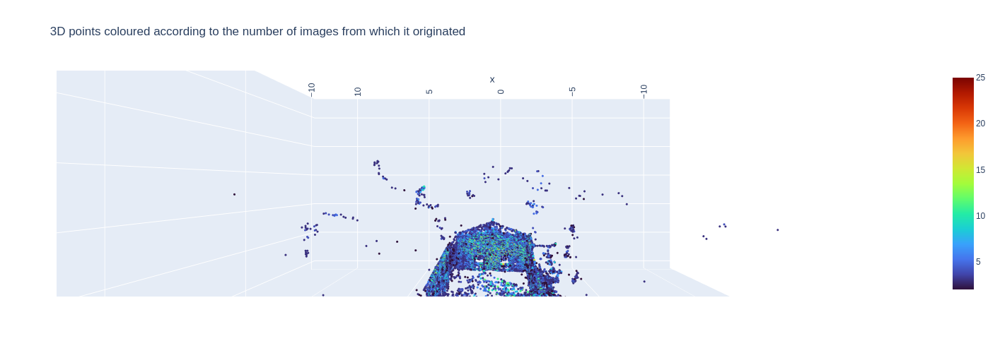

In [17]:
points, num_images = zip(*[(point.xyz, np.sum(point.image_ids != -1)) for point in sorted(points3D.values())])
points = np.array(points)
num_images = np.array(num_images)
plot_3d_points(points, num_images, '3D points coloured according to the number of images from which it originated', center=True)


#### <span style='color:Green'> - Plot the 3D points coloured according to the **error**. </span> - What is this parameter? Can you extract any conclusions from the visualization?

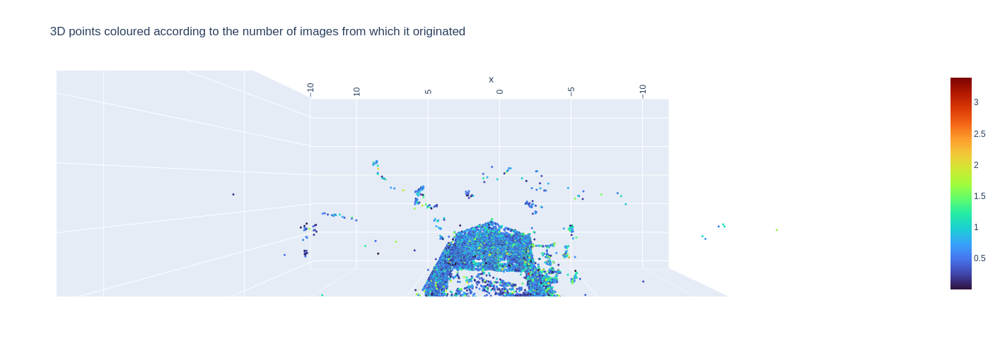

In [18]:
points, errors = zip(*[(point.xyz, point.error) for point in sorted(points3D.values())])
points = np.array(points)
errors = np.array(errors)
plot_3d_points(points, errors, '3D points coloured according to the error', center=True)

## 2.3 Plot the 3D points that correspond to a keypoint in the first image. Also plot the image with the keypoints (1.0)


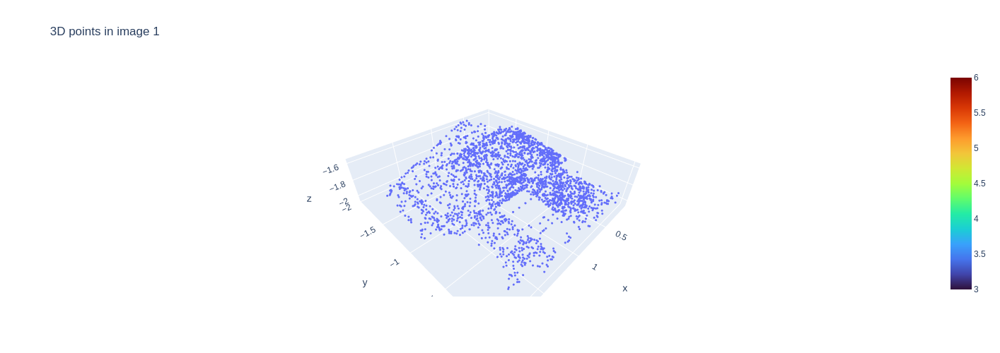

In [19]:
point_idxs = [pid for pid in sorted_images[0].point3D_ids if pid != -1]
points = np.array([points3D[pid].xyz for pid in point_idxs])
plot_3d_points(points, title='3D points in image 1')

C:\Users\MataBits\AppData\Local\Temp\ipykernel_13332\1412316909.py:21: UserWarning:

Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.



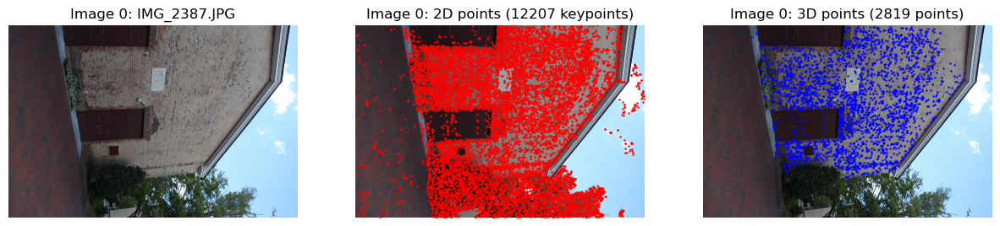

In [20]:
# Plot the 2D keypoints as a scatter plot in the first image.
i = 0
image = cv2.imread('./gerrard-hall/images/' + sorted_images[i].name)
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

fig, axs = plt.subplots(1, 3, figsize=(15, 10))
# Plot image
axs[0].imshow(image)
axs[0].axis('off')
axs[0].set_title(f"Image {i}: {sorted_images[i].name}")
# Plot 2D points
axs[1].imshow(image)
axs[1].axis('off')
axs[1].scatter(sorted_images[i].xys[:, 0], sorted_images[i].xys[:, 1], s=0.5, c='r')
axs[1].set_title(f"Image {i}: 2D points ({len(sorted_images[i].xys)} keypoints)")
# Plot 3D points
axs[2].imshow(image)
axs[2].axis('off')
axs[2].scatter(sorted_images[i].xys[sorted_images[i].point3D_ids != -1, 0], sorted_images[i].xys[sorted_images[i].point3D_ids != -1, 1], s=0.5, c='b')
axs[2].set_title(f"Image {i}: 3D points ({np.sum([sorted_images[i].point3D_ids != -1])} points)")
fig.show()

## 2.4 Create a visualization for the number of matches between all images. (1.0)
For example: https://seaborn.pydata.org/generated/seaborn.heatmap.html

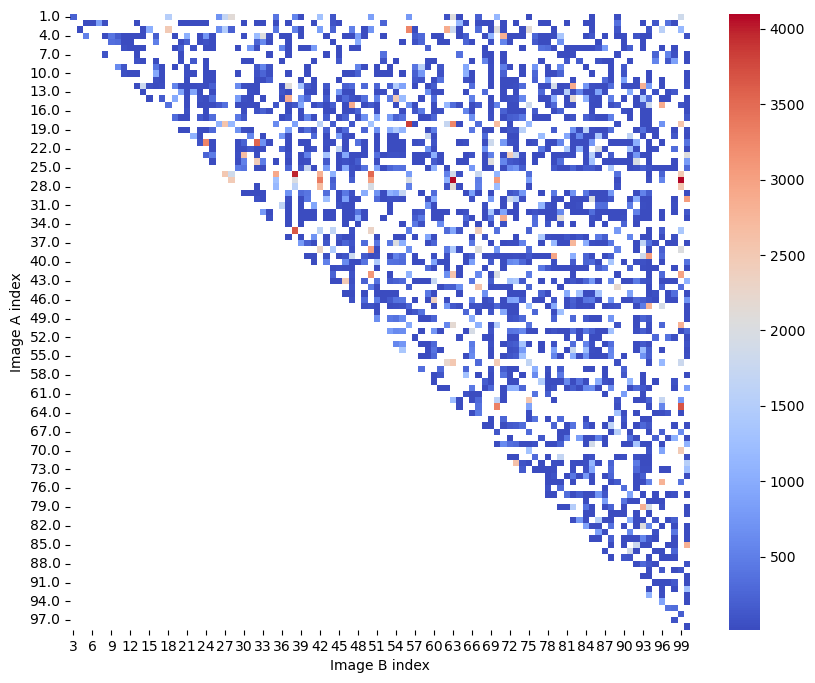

In [21]:
# Create a dataframe from the dictionary "count_matches" of Tuple[int, int]: int
count_matches = {k: len(v) for k, v in matches.items()}
df = pd.DataFrame.from_dict(count_matches, orient='index', columns=['KP matches'])
df[['Image A index', 'Image B index']] = pd.DataFrame(df.index.tolist(), index=df.index)
df = df.pivot(index='Image A index', columns='Image B index', values='KP matches')
plt.figure(figsize=(10,8))
sns.heatmap(df, cmap='coolwarm')
plt.show()

## 2.5 Visualize the keypoints and matches between the two images used in lab 4 using Colmap, how it compares to the results from lab 4? (1.0)
#### <span style='color:Green'> You can use the GUI to get the keypoints and matches and then visualize it here, following the same style as in lab 4 to get comparable results. </span>

To get the keypoints and matches from the GUI, you can use the following steps:
1. We create a new project in the GUI. In this menu, we create a new database and add the images from the first and second image of the sequence.
2. Next, we go to the "Processing" menu and select "Feature extraction". We set the parameters and run the feature extraction.
   
   We tell the program to automatically extract focal length information from the embedded EXIF information.

3. Finally, we go to the "Processing" menu and select "Feature matching". We set the parameters and run the feature matching.
   
   According to the documentation, the Exhaustive Matching is the most suited for this task, as we are using just 2 images.

In [4]:
database_path = "./castle/database.db"
keypoints, matches, count_no_data = load_keypoints_and_matches(database_path)

In [5]:
print(f"Loaded keypoints from {len(keypoints)} images. These are the {len(keypoints[1])} keypoints for one of them:")
print(keypoints[1])

Loaded keypoints from 2 images. These are the 4881 keypoints for one of them:
[[ 1.14744797e+02  9.27723408e+00 -2.79689401e-01  8.59814346e-01
  -8.59814346e-01 -2.79689401e-01]
 [ 1.27133644e+02  9.66111851e+00  6.03373945e-01 -7.28514135e-01
   7.28514135e-01  6.03373945e-01]
 [ 1.60739117e+01  1.04849434e+01 -4.80692536e-01  9.48775113e-01
  -9.48775113e-01 -4.80692536e-01]
 ...
 [ 5.94837646e+02  3.35588531e+02 -2.21888657e+01 -4.51728706e+01
   4.51728706e+01 -2.21888657e+01]
 [ 3.59450012e+02  3.94723633e+02  4.10061417e+01 -2.57256317e+01
   2.57256317e+01  4.10061417e+01]
 [ 7.03702026e+02  4.64884430e+02 -1.67332535e+01 -6.74254532e+01
   6.74254532e+01 -1.67332535e+01]]


In [6]:
print(f"Loaded {len(matches)} matches. {count_no_data}/{len(matches)+count_no_data} matches contained no data")

Loaded 1 matches. 0/1 matches contained no data


Visualize the keypoints

C:\Users\MataBits\AppData\Local\Temp\ipykernel_19084\2639854432.py:20: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


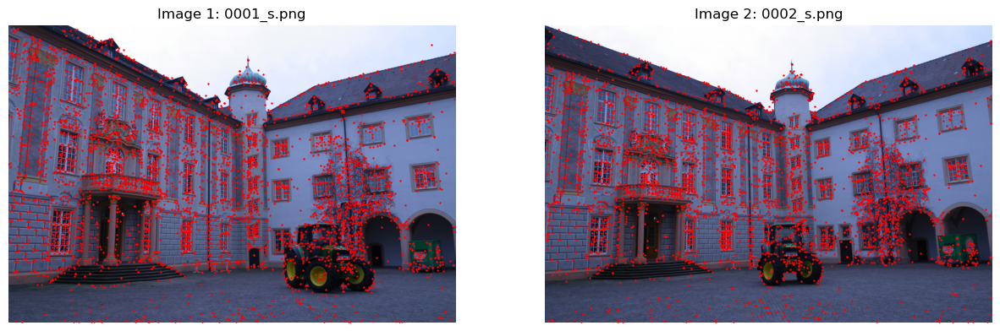

In [7]:
image_paths = os.listdir('./castle/images/')
fig, axs = plt.subplots(1, len(image_paths), figsize=(15, 10))

image1 = cv2.imread('./castle/images/' + image_paths[0])
image1 = cv2.cvtColor(image1, cv2.COLOR_BGR2RGB)

axs[0].imshow(image1)
axs[0].axis('off')
axs[0].scatter(keypoints[1][:, 0], keypoints[1][:, 1], s=0.5, c='r')
axs[0].set_title(f"Image 1: {image_paths[0]}")

image2 = cv2.imread('./castle/images/' + image_paths[1])
image2 = cv2.cvtColor(image2, cv2.COLOR_BGR2RGB)

axs[1].imshow(image2)
axs[1].axis('off')
axs[1].scatter(keypoints[2][:, 0], keypoints[2][:, 1], s=0.5, c='r')
axs[1].set_title(f"Image 2: {image_paths[1]}")

fig.show()

Visualize the matches

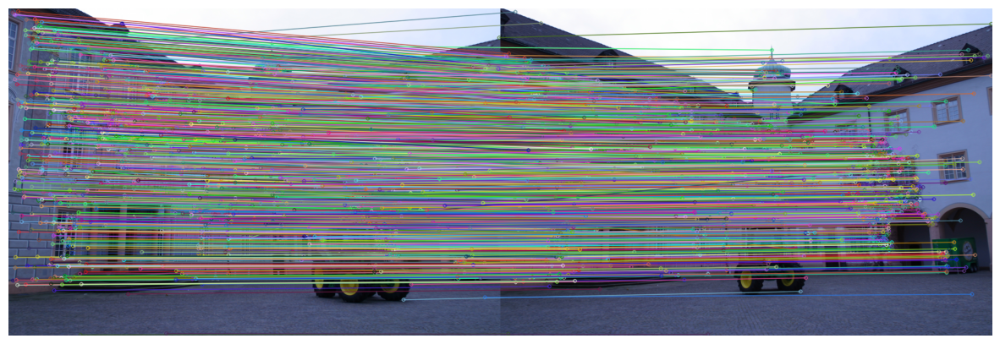

In [8]:
kp1 = [cv2.KeyPoint(kp[0], kp[1], 1) for kp in keypoints[1]]
kp2 = [cv2.KeyPoint(kp[0], kp[1], 1) for kp in keypoints[2]]

cv2_matches = []
for m in matches[(1, 2)]:
    cv2_matches.append(cv2.DMatch(m[0], m[1], 0))

image_12 = cv2.drawMatches(image1, kp1, image2, kp2, cv2_matches, None, flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)
fig = plt.figure(figsize=(15, 10))
plt.axis('off')
plt.imshow(image_12)
plt.show()

## 2.6 Triangulate and visualize the 3D points from the keypoints extracted using Colmap on the two images used in lab 4, how it compares to the results from lab 4? (1.0) 
#### <span style='color:Green'> - Use the triangulation from lab 4 to the get the 3D points and visualize them following the same style. </span>

In [10]:
import utils
import importlib
importlib.reload(utils)
from operator import itemgetter
np.random.seed(0)

h, w, c = image1.shape

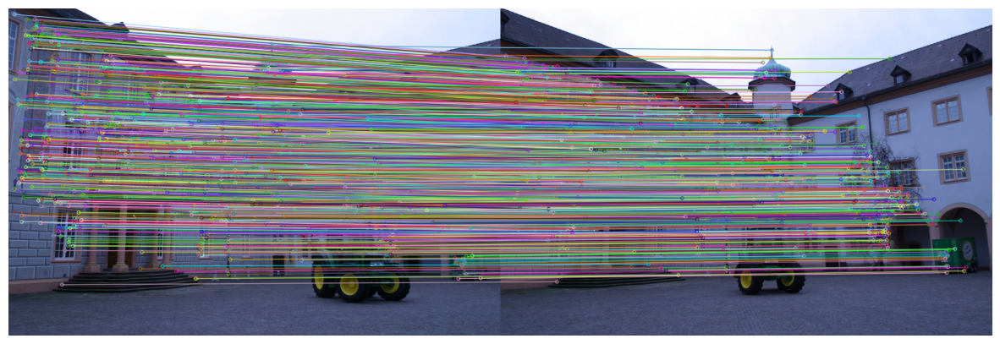

In [11]:
# Robust estimation of the fundamental matrix #
points1 = []
points2 = []

for m in cv2_matches:
    points1.append([kp1[m.queryIdx].pt[0], kp1[m.queryIdx].pt[1], 1])
    points2.append([kp2[m.trainIdx].pt[0], kp2[m.trainIdx].pt[1], 1])

points1 = np.asarray(points1)
points1 = points1.T
points2 = np.asarray(points2)
points2 = points2.T

F, indices_inlier_matches = utils.ransac_fundamental_matrix(points1, points2, 1, 5000)
inlier_matches = itemgetter(*indices_inlier_matches)(cv2_matches)

image_12 = cv2.drawMatches(image1, kp1, image2, kp2, inlier_matches, None, flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)
fig = plt.figure(figsize=(15, 10))
plt.axis('off')
plt.imshow(image_12)
plt.show()

In [13]:
# Camera calibration matrix
K = np.array([[2362.12, 0, 1520.69], [0, 2366.12, 1006.81], [0, 0, 1]])
scale = 0.3
H = np.array([[scale, 0, 0], [ 0, scale, 0], [0, 0, 1]])
K = H @ K

E = utils.essential_from_fundamental(K, F)
# make sure that E has rank 2 (third singular value is zero)
U, D, Vh = LA.svd(E)
print(f'D: {D} --> third value of D: {D[-1]:.9f}')

D: [2.11589982e+02 2.08424578e+02 5.63616899e-15] --> third value of D: 0.000000000


In [14]:
# # camera projection matrix for the first camera
# we assume that the first camera is in canonical pose
# P1 = [K | 0]
P1 = np.hstack((K, np.zeros((3,1))))

W = np.array([[0, -1, 0], [1, 0, 0], [0, 0, 1]])
u3 = U[:, -1]

# four possible matrices for the second camera
Pc2 = [None, None, None, None]
Pc2[0] = K @ np.hstack((utils.reflect_rotation(U @ W @ Vh), u3.reshape(3,1)))
Pc2[1] = K @ np.hstack((utils.reflect_rotation(U @ W @ Vh), -u3.reshape(3,1)))
Pc2[2] = K @ np.hstack((utils.reflect_rotation(U @ W.T @ Vh), u3.reshape(3,1)))
Pc2[3] = K @ np.hstack((utils.reflect_rotation(U @ W.T @ Vh), -u3.reshape(3,1)))

_________________________
_________________________
_________________________
_________________________


(-1.5, 1.5)

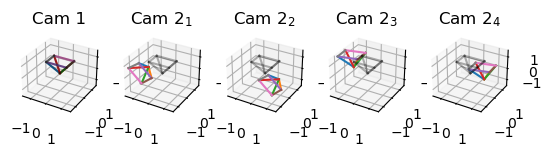

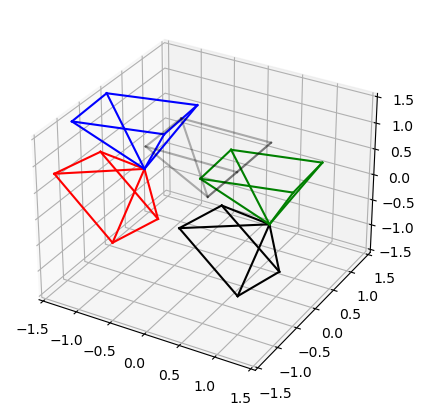

In [15]:
# plot the first camera and the four possible solutions for the second figure:
fig = plt.figure()
axs = [fig.add_subplot(1,5,i+1, projection='3d') for i in range(5)]
titles = ["Cam 1"] + [r"Cam $2_{%s}$" % int(i+1) for i in range(len(Pc2)) ]

low_lim, up_lim = -1.5, 1.5
for ax, title, P in zip(axs, titles, [P1] + Pc2):
    utils.plot_camera(P, w, h, 1, ax=ax)
    utils.plot_camera(P1, w, h, 1, ax=ax, alpha=0.3, color="k")  # Show Cam1 for reference
    ax.set_title(title)
    ax.set_xlim(low_lim, up_lim)
    ax.set_ylim(low_lim, up_lim)
    ax.set_zlim(low_lim, up_lim)

fig = plt.figure(figsize=(5,5))
ax = fig.add_subplot(1,1,1, projection='3d')
for P, color in zip(Pc2, ['r','k','b','g']):
    utils.plot_camera(P,w,h, 1, ax=ax, color=color)
utils.plot_camera(P1,w,h, 1, ax=ax, alpha=0.3, color="k")  # Show Cam1 for reference
ax.set_xlim(low_lim, up_lim)
ax.set_ylim(low_lim, up_lim)
ax.set_zlim(low_lim, up_lim)

Camera selected: 2


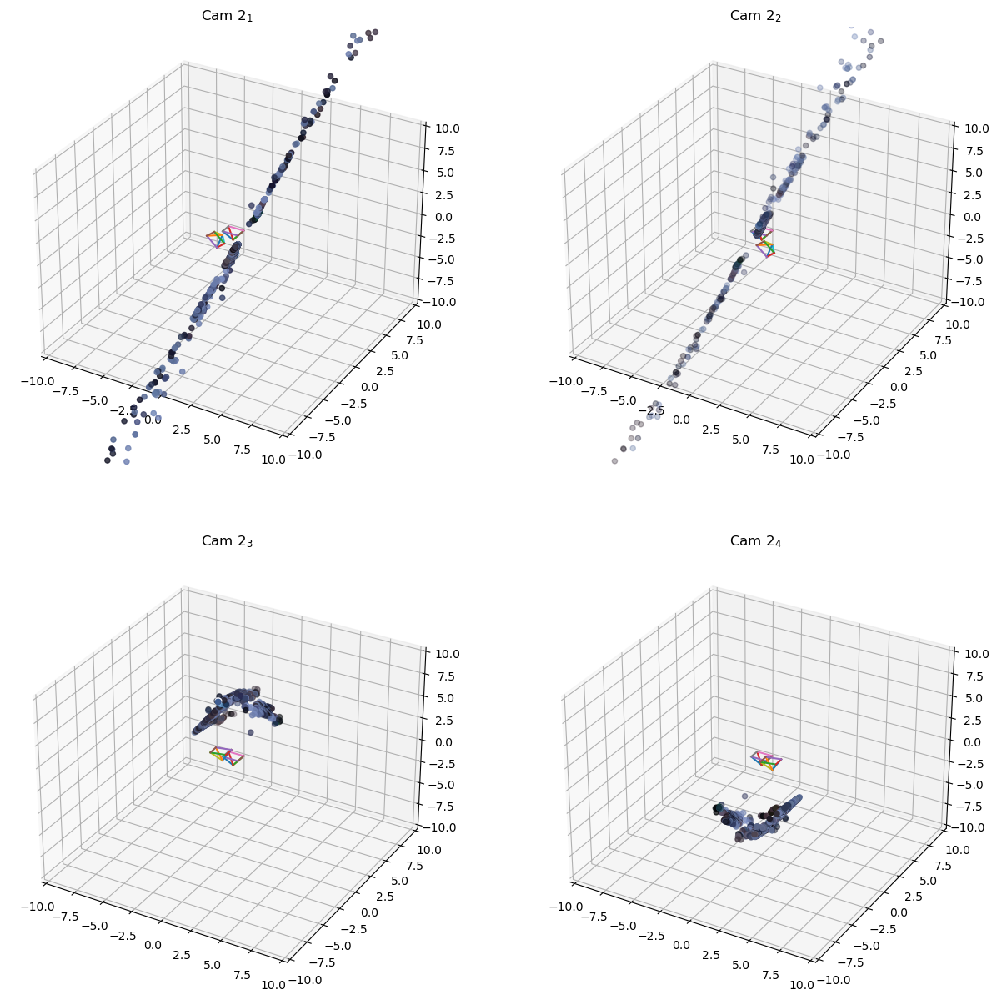

In [16]:
# Obtain the inlier points projective coordinates for Camera 1 and 2
x1 = points1[:, indices_inlier_matches]
x2 = points2[:, indices_inlier_matches]

# Prepare figure 
fig = plt.figure(figsize=(15,15))
axs = [fig.add_subplot(2,2,i+1, projection='3d') for i in range(4)]

# Variable for optimal camera
P2_selected = None

low_lim, up_lim = -10, 10
max_infront = (0, 0)
for i, ax, P2 in zip(range(len(Pc2)), axs, Pc2):
    # Estimate by triangulization the 3D coordinates of the matches
    X_pred = utils.triangulate(x1, x2, P1, P2, [w, h])
    X_pred = X_pred / X_pred[3]
    X_eucl = utils.homogeneous2euclidean(X_pred)

    # Render the 3D point cloud
    x_img = np.transpose(x1[:2]).astype(int)
    rgb_txt = (image1[x_img[:,1], x_img[:,0]])/255
    utils.draw_points(X_eucl.T, color=rgb_txt, ax=ax)
    utils.plot_camera(P1,w,h,1, ax=ax)
    utils.plot_camera(P2,w,h,1, ax=ax)
    ax.set_title(r"Cam $2_{%d}$" % (i+1))
    ax.set_xlim(low_lim, up_lim)
    ax.set_ylim(low_lim, up_lim)
    ax.set_zlim(low_lim, up_lim)

    # Project the 3D points to the image plane
    x1_pred = P1 @ X_pred
    x2_pred = P2 @ X_pred
    # Check that the third component is positive
    positive_z = np.sum((x1_pred[-1] >= 0) & (x2_pred[-1] >= 0))

    if np.isclose([positive_z], [len(X_eucl[0])], atol=1):
        print(f"Camera selected: {i}")
        P2_selected = P2

# From now own P2 will be the camera you selected
P2 = P2_selected

In [27]:
def plot_3d_points_alt(X, color=None, title="3D points"):
    fig = go.Figure(layout=dict(height=400, width=550, title=title))
    fig.add_trace(go.Scatter3d(x=X[:,0], y=X[:,1], z=X[:,2],mode='markers',name='3d points',marker=dict(color=color, size=2)))
    fig.show()

# Estimate by triangulization the 3D coordinates of the matches
X_pred = utils.triangulate(x1, x2, P1, P2, [w, h])
X_eucl = X_pred/X_pred[-1,:]
points3d = X_eucl[:3].T
plot_3d_points_alt(points3d, rgb_txt)


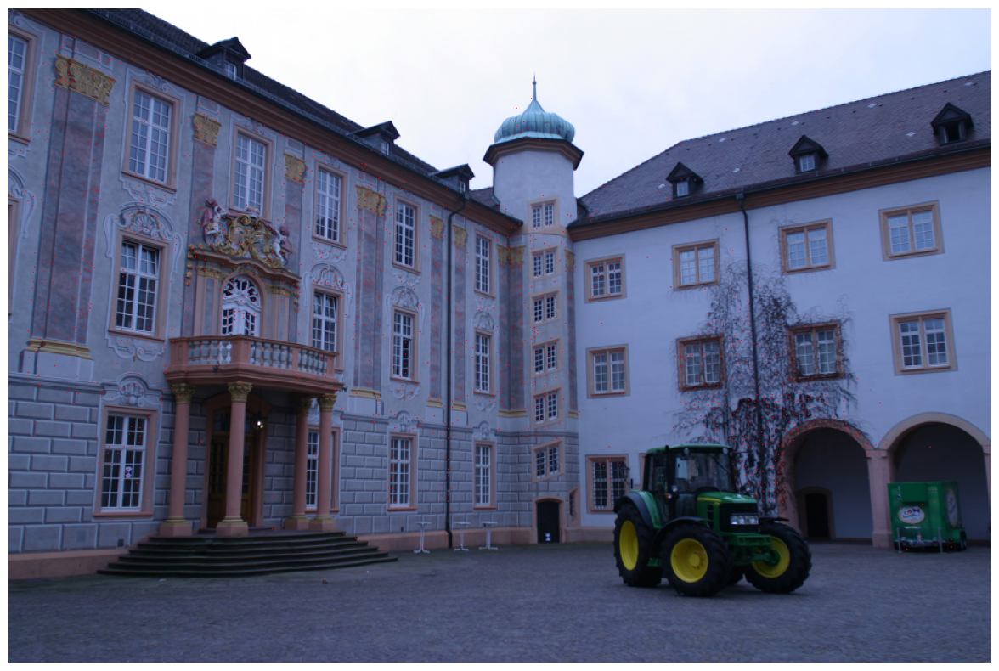

In [19]:
import copy
img_with_selected_points = copy.deepcopy(image1)
img_with_selected_points[x_img[:,1], x_img[:,0]] = [255,0,0]
plt.figure(figsize = (15,10))
plt.axis('off')
plt.imshow(img_with_selected_points)
plt.show()

## 2.7 Visualize the sparse reconstruction using the 2 images from lab 4, and the complete CASTLE dataset. Comment on the differences between techniques and number of images used. (1.0)
#### <span style='color:Green'> - Use the reconstruction from Colmap to the get the 3D points and visualize them following the same style, using two images and the complete dataset. </span>

In [26]:
def create_model(reconstruction_path):
    model = Model()
    model.read_model(reconstruction_path, ext='.bin') 
    return model

def show_model(model):
    model.create_window()
    model.add_points()
    model.add_cameras(scale=0.25)
    model.show()

In [22]:
castle_reconstruction_path = "./castle/sparse"
castle_full_reconstruction_path = "./castle_full/sparse/0"

model_castle = create_model(castle_reconstruction_path)
model_castle_full = create_model(castle_full_reconstruction_path)

In [121]:
show_model(model_castle)

In [122]:
show_model(model_castle_full)

In [28]:
points_castle = np.array([point.xyz for point in model_castle.points3D.values()])
plot_3d_points_alt(points_castle, title='3D points for 2 images')

In [29]:
points_castle_full = np.array([point.xyz for point in model_castle_full.points3D.values()])
plot_3d_points_alt(points_castle_full, title='3D points for all images')